In [1]:
# Data manipulation and processing
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score

# Geospatial data processing
import geopandas as gpd
from shapely.geometry import LineString, Point

# Data visualization
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.ticker import FixedLocator
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors
from coord_convert.transform import wgs2gcj, gcj2wgs

from tqdm import tqdm

# System operations
import os

In [2]:
# Configure Matplotlib global style
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 400,
    'font.size': 10
})

In [3]:
root = r'PATH_TO_YOUR_DATA'

In [4]:
od1903 = pd.read_csv(os.path.join(root, 'data', 'od201903.csv'))
od2403 = pd.read_csv(os.path.join(root, 'data', 'od202403.csv'))

In [5]:
def data_prepross(df):
    visit_count = df.loc[:,['visit_grid','home_grid']].groupby('visit_grid', as_index=False).count()
    df = df.loc[df['visit_grid'].isin(np.array(visit_count.loc[visit_count['home_grid']>=3]['visit_grid']))]
    df = df.loc[df['gender'].isin([1,2])]
    visit_fre = od1903.loc[:,['home_grid','stay_fre']].groupby('home_grid', as_index=False).sum()
    df = df.loc[df['home_grid'].isin(visit_fre.loc[visit_fre['stay_fre']>60]['home_grid'])]
    df = df.loc[df['age'].isin(['a2','a3','a4','a5','a6','a7'])]
    df.loc[(df['home_grid']==df['visit_grid']) & (df['ptype']!=1), 'ptype'] = 1
    df_ses = df.merge(house_price_pop.loc[:,['home_grid','ses','ses2', 'ses3']])
    return df_ses

In [6]:
house_price_pop = pd.read_csv(os.path.join(root, 'data', 'house_price_pop.csv'))

In [7]:
od_line_geo = pd.read_csv(os.path.join(root, 'data', 'od19_24_fnid_distance.csv'))

In [8]:
city_grid = gpd.read_file(os.path.join(root, 'data', 'shp', 'ss_city_grid.shp'))
sixth = gpd.read_file(os.path.join(root, 'data', 'shp', 'SixthRing_Polygon.shp'))
sixth_fnid = city_grid.sjoin(sixth, how='inner', predicate='intersects')['fnid'].unique()

grid_point = city_grid.loc[:,['fnid', 'geometry']].copy()
grid_point['geometry'] = grid_point.to_crs(32650).geometry.centroid
grid_point['lon'] = grid_point.geometry.x.astype('int32')
grid_point['lat'] = grid_point.geometry.y.astype('int32')

In [9]:
def cal_visit_ses(od_data):
    data_new = data_prepross(od_data)
    data_att = data_new.merge(od_line_geo, on=['home_grid', 'visit_grid'])
    data_visit = data_att.loc[(data_att['ptype']!=1) & (data_att['distance']>360)]
    data_visit_time = data_visit.loc[:,['visit_grid','ses','sum_time']].groupby(['visit_grid','ses'], as_index=False).sum()
    data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
    data_visit_grid_attr['avg_ses'] = data_visit_grid_attr['avg_ses'].apply(round) # lambda x: np.ceil(x/10).astype(int)
    return city_grid.loc[:,['fnid','geometry']].merge(data_visit_grid_attr.rename(columns={'visit_grid':'fnid'}))

In [10]:
def weighted_avg(group, col, weight_col):
    return (group[col] * group[weight_col]).sum() / group[weight_col].sum()

group_col = ['home_grid','ses']
def visit_prob(df):
    df_group_time = df.loc[:,group_col+['sum_time']].groupby(group_col, as_index=False).sum()
    df_group_merge = df.loc[:,['visit_grid']+group_col+['sum_time']].merge(df_group_time, on=group_col, suffixes=('','_sum'))
    df_group_merge['time_prob'] = df_group_merge['sum_time']/df_group_merge['sum_time_sum']
    return df_group_merge.loc[df_group_merge['time_prob']<1]

def visit_matrix(data):
    data_new = data_prepross(data)
    data_visit = data_new.loc[data_new['ptype']!=1]
    data_visit_prob = visit_prob(data_visit)
    data_visit_time = data_visit.loc[:,['visit_grid','ses','sum_time']].groupby(['visit_grid','ses'], as_index=False).sum()

    data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')

    data_visit_link = data_visit_prob.merge(data_visit_grid_attr)
    data_visit_link['avg_ses'] = data_visit_link['avg_ses'].apply(round)
    data_visit_link_m = data_visit_link.loc[:,['ses','avg_ses','sum_time']].groupby(['ses','avg_ses'], as_index=False).sum()
    data_visit_link_m['time_prob'] = data_visit_link_m.groupby('ses',group_keys=False)['sum_time'].apply(lambda x : x/np.array(x.sum()))
    data_visit_link_m = data_visit_link_m.pivot(index="avg_ses", columns="ses", values="time_prob")

    return data_visit_link_m

In [11]:
visit_matrix1903 = visit_matrix(od1903)
visit_matrix2403 = visit_matrix(od2403)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3500682540.py:17: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3500682540.py:17: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply

In [12]:
def plot_visit_prefer(visit_matrix, ax=None, add_colorbar=False):
    cuts = 100

    if ax is None:
        f, ax = plt.subplots(figsize=(5, 4.5))
    else:
        ax = ax
    sns.heatmap(visit_matrix, annot=False, linewidths=.3, cmap="RdYlBu_r", vmin=0.00, vmax=5, ax=ax)
    x_ticks = np.arange(0, cuts + 1, 10)
    ax.set_xticks([1,20,40,60,80,100])
    ax.set_xticklabels([1,20,40,60,80,100])
    y_ticks = np.arange(0, cuts + 1, 10)
    ax.set_yticks([1,20,40,60,80,100])
    ax.set_yticklabels([1,20,40,60,80,100])
    ax.invert_yaxis()
    # ax.set_xlabel("$SES_{individuals}$")
    ax.set_xlabel(r'$\mathrm{SES}_{\mathit{individual}}$')
    ax.set_ylabel(r'$\mathrm{SES}_{\mathit{places}}$')

    if add_colorbar:
        cbar = ax.collections[0].colorbar
        cbar.set_label('Visit Probability (%)')
    return ax

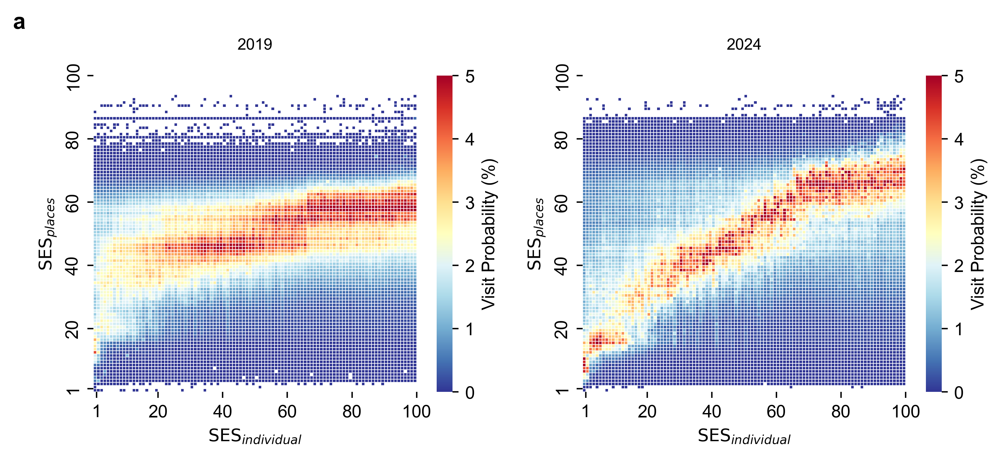

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.8), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_matrix1903*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_matrix2403*100, axs[1], add_colorbar=True)

axs[0].set_title('2019', fontsize=9, pad=15)
axs[1].set_title('2024', fontsize=9, pad=15)

axs[0].text(-0.25, 1.2, 'a', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')

plt.tight_layout()
# plt.savefig('fig1a.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [14]:
def visit_matrix_type(data, sel_type):
    data_new = data_prepross(data)
    data_visit = data_new.loc[data_new['ptype']==sel_type]
    data_visit_prob = visit_prob(data_visit)
    data_visit_time = data_visit.loc[:,['visit_grid','ses','sum_time']].groupby(['visit_grid','ses'], as_index=False).sum()

    data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')

    data_visit_link = data_visit_prob.merge(data_visit_grid_attr)
    data_visit_link['avg_ses'] = data_visit_link['avg_ses'].apply(round)
    data_visit_link_m = data_visit_link.loc[:,['ses','avg_ses','sum_time']].groupby(['ses','avg_ses'], as_index=False).sum()
    data_visit_link_m['time_prob'] = data_visit_link_m.groupby('ses',group_keys=False)['sum_time'].apply(lambda x : x/np.array(x.sum()))
    data_visit_link_m = data_visit_link_m.pivot(index="avg_ses", columns="ses", values="time_prob")

    return data_visit_link_m

visit_matrix1903_visit = visit_matrix_type(od1903, 0)
visit_matrix2403_visit = visit_matrix_type(od2403, 0)

visit_matrix1903_work = visit_matrix_type(od1903, 2)
visit_matrix2403_work = visit_matrix_type(od2403, 2)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\2692939738.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\2692939738.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(w

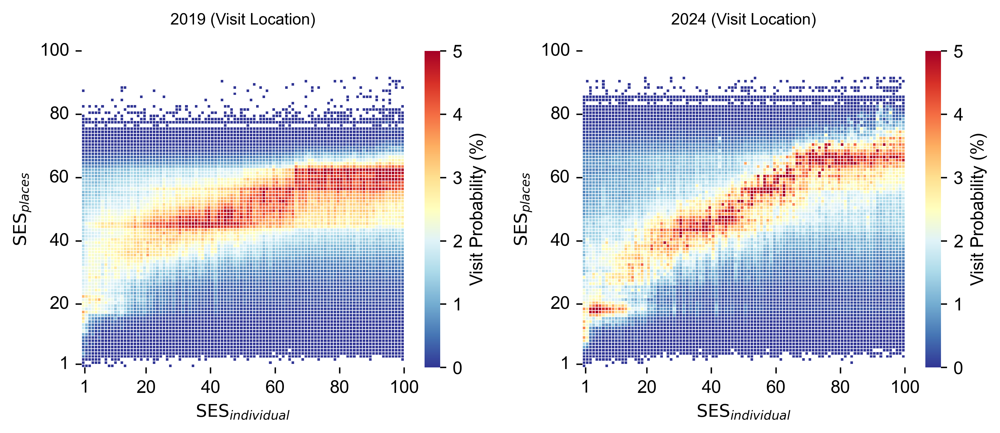

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.5), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_matrix1903_visit*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_matrix2403_visit*100, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Visit Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Visit Location)', fontsize=9, pad=15)

plt.tight_layout()
# plt.savefig('fig1a(visit).png', dpi=500, bbox_inches='tight')
plt.show()

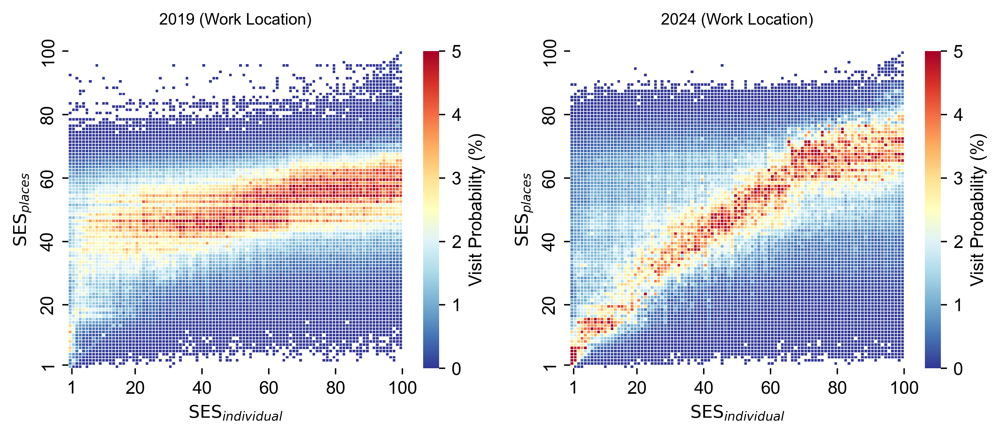

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.5), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_matrix1903_work*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_matrix2403_work*100, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Work Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Work Location)', fontsize=9, pad=15)

plt.tight_layout()
# plt.savefig('fig1a(work).png', dpi=500, bbox_inches='tight')
plt.show()

In [17]:
def cal_SE_index(trip_matrix, max_distance=10):
    L = trip_matrix.shape[0]
    phi = 0.0
    phi += np.sum(np.diag(trip_matrix))
    for k in range(1, max_distance + 1):
        for i in range(L - k):
            phi += trip_matrix[i, i + k]
            phi += trip_matrix[i + k, i]
    return phi / L

In [18]:
cal_SE_index(np.nan_to_num(visit_matrix1903.to_numpy()))

0.28195103642424985

In [19]:
cal_SE_index(np.nan_to_num(visit_matrix2403.to_numpy()))

0.38815077629639577

In [20]:
cal_SE_index(np.nan_to_num(visit_matrix1903_visit.to_numpy()))

0.2918817150088923

In [21]:
cal_SE_index(np.nan_to_num(visit_matrix2403_visit.to_numpy()))

0.3596172974347294

In [22]:
cal_SE_index(np.nan_to_num(visit_matrix1903_work.to_numpy()))

0.2768471459967065

In [23]:
cal_SE_index(np.nan_to_num(visit_matrix2403_work.to_numpy()))

0.42664904607951165

In [24]:
def calculate_visit_flow_sankey(od_data):
    ses = 'ses'
    data_new = data_prepross(od_data)
    a = data_new.loc[(data_new['ptype'] != 1), [ses, 'visit_grid', 'sum_time']]
    a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum()
    visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()
    group1 = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby([ses, 'visit_grid'], as_index=False).sum()
    group2 = a.loc[:, [ses, 'sum_time']].groupby([ses], as_index=False).sum().rename(columns={'sum_time': 'sum_time_sum'})
    result = group1.merge(group2, on=ses)
    result['visit_prob'] = result['sum_time'] / result['sum_time_sum']
    result = result.loc[:, [ses, 'visit_grid', 'visit_prob']]
    result_new = result.merge(visit_ses, on=['visit_grid'], suffixes=('', '_meet')).drop('visit_grid', axis=1)
    result_new['meet_prob'] = result_new['visit_prob'] * result_new['sum_time']
    result_new = result_new.loc[:, [ses, ses+'_meet', 'meet_prob']].groupby([ses, ses+'_meet'], as_index=False).sum()
    result_new['meet_prob_norm'] = result_new.groupby(ses)['meet_prob'].transform(lambda x: x / x.sum())
    # result_new[ses] = 'ses'+result_new[ses].astype('str')
    # result_new[ses+'_meet'] = 'ses'+result_new[ses+'_meet'].astype('str')
    return result_new

visit_flow1903 = calculate_visit_flow_sankey(od1903)
visit_flow2403 = calculate_visit_flow_sankey(od2403)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4213653261.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4213653261.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()


In [25]:
visit_flow1903_m = visit_flow1903.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")
visit_flow2403_m = visit_flow2403.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")

In [26]:
def plot_visit_prefer(visit_matrix, ax=None, add_colorbar=False):
    cuts = 100

    if ax is None:
        f, ax = plt.subplots(figsize=(5, 4.5))
    else:
        ax = ax
    sns.heatmap(visit_matrix, annot=False, linewidths=.3, cmap="RdYlBu_r", vmin=0.00, vmax=2, ax=ax)
    x_ticks = np.arange(0, cuts + 1, 10)
    ax.set_xticks([1,20,40,60,80,100])
    ax.set_xticklabels([1,20,40,60,80,100])
    y_ticks = np.arange(0, cuts + 1, 10)
    ax.set_yticks([1,20,40,60,80,100])
    ax.set_yticklabels([1,20,40,60,80,100])
    ax.invert_yaxis()
    # ax.set_xlabel("$SES_{individuals}$")
    ax.set_xlabel(r'$\mathregular{SES_{individual_{i}}}$')
    ax.set_ylabel(r'$\mathregular{SES_{individual_{j}}}$')
    # ax.set_ylabel("$SES_{places}$")

    if add_colorbar:
        cbar = ax.collections[0].colorbar
        cbar.set_label('Contact Probability (%)')
        cbar.set_ticks([0, 0.5, 1, 1.5, 2]) 
        cbar.set_ticklabels(['0', '0.5', '1.0', '1.5', '2.0']) 

    return ax

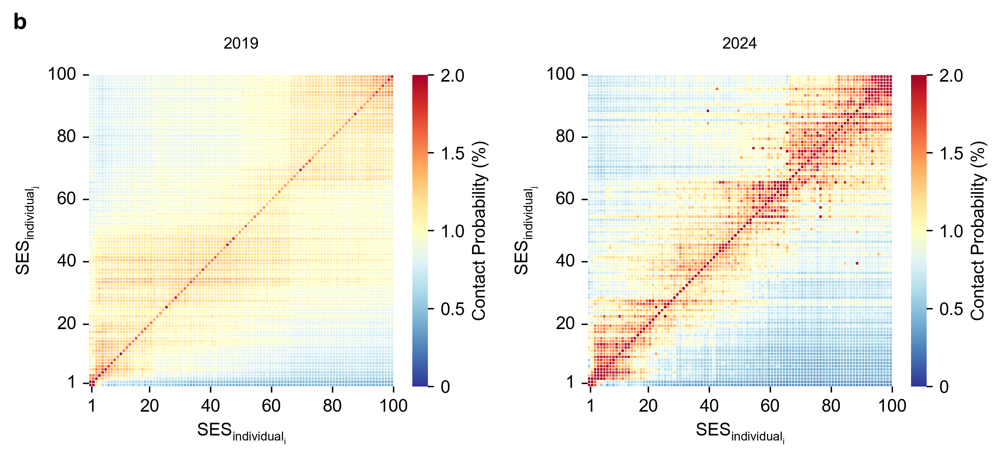

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.8), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_flow1903_m*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_flow2403_m*100, axs[1], add_colorbar=True)

axs[0].set_title('2019', fontsize=9, pad=15)
axs[1].set_title('2024', fontsize=9, pad=15)

axs[0].text(-0.25, 1.2, 'b', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')

plt.tight_layout()
# plt.savefig('fig1b.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [28]:
def calculate_visit_flow_sankey_type(od_data, sel_type):
    ses = 'ses'
    data_new = data_prepross(od_data)
    a = data_new.loc[(data_new['ptype'] == sel_type), [ses, 'visit_grid', 'sum_time']]
    a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum()
    visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()
    group1 = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby([ses, 'visit_grid'], as_index=False).sum()
    group2 = a.loc[:, [ses, 'sum_time']].groupby([ses], as_index=False).sum().rename(columns={'sum_time': 'sum_time_sum'})
    result = group1.merge(group2, on=ses)
    result['visit_prob'] = result['sum_time'] / result['sum_time_sum']
    result = result.loc[:, [ses, 'visit_grid', 'visit_prob']]
    result_new = result.merge(visit_ses, on=['visit_grid'], suffixes=('', '_meet')).drop('visit_grid', axis=1)
    result_new['meet_prob'] = result_new['visit_prob'] * result_new['sum_time']
    result_new = result_new.loc[:, [ses, ses+'_meet', 'meet_prob']].groupby([ses, ses+'_meet'], as_index=False).sum()
    result_new['meet_prob_norm'] = result_new.groupby(ses)['meet_prob'].transform(lambda x: x / x.sum())
    # result_new[ses] = 'ses'+result_new[ses].astype('str')
    # result_new[ses+'_meet'] = 'ses'+result_new[ses+'_meet'].astype('str')
    return result_new

visit_flow1903_visit = calculate_visit_flow_sankey_type(od1903,0)
visit_flow2403_visit = calculate_visit_flow_sankey_type(od2403,0)

visit_flow1903_work = calculate_visit_flow_sankey_type(od1903,2)
visit_flow2403_work = calculate_visit_flow_sankey_type(od2403,2)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3967453699.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3967453699.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  visit_ses = a.loc[:, ['visit_grid', ses, 'sum_time']].groupby(['visit_grid', ses]).sum().unstack().fillna(0).stack().reset_index()
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3967453699.py:6: FutureWarning: The previ

In [29]:
visit_flow1903_m_visit = visit_flow1903_visit.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")
visit_flow2403_m_visit = visit_flow2403_visit.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")

visit_flow1903_m_work = visit_flow1903_work.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")
visit_flow2403_m_work = visit_flow2403_work.loc[:,['ses','ses_meet','meet_prob_norm']].pivot(index="ses_meet", columns="ses", values="meet_prob_norm")

In [30]:
def plot_visit_prefer(visit_matrix, ax=None, add_colorbar=False):
    cuts = 100

    if ax is None:
        f, ax = plt.subplots(figsize=(5, 4.5))
    
    # Plot heatmap
    sns.heatmap(visit_matrix, annot=False, linewidths=.3, cmap="RdYlBu_r", vmin=0.00, vmax=2, ax=ax)
    
    # Set ticks and labels
    ax.set_xticks([1, 20, 40, 60, 80, 100])
    ax.set_xticklabels([1, 20, 40, 60, 80, 100])
    ax.set_yticks([1, 20, 40, 60, 80, 100])
    ax.set_yticklabels([1, 20, 40, 60, 80, 100])
    ax.invert_yaxis()
    
    # Set axis labels
    ax.set_xlabel(r'$\mathregular{SES_{individual_{i}}}$')
    ax.set_ylabel(r'$\mathregular{SES_{individual_{j}}}$')
    
    # Add diagonal lines with ±10 offset
    x = np.arange(0, cuts)
    ax.plot(x, np.clip(x + 10, 0, cuts), 'b:', linewidth=1, alpha=0.5)  # Upper band
    ax.plot(x, np.clip(x - 10, 0, cuts), 'b:', linewidth=1, alpha=0.5)  # Lower band
    
    # Add colorbar if requested
    if add_colorbar:
        cbar = ax.collections[0].colorbar
        cbar.set_label('Contact Probability (%)')
        cbar.set_ticks([0, 0.5, 1, 1.5, 2])
        cbar.set_ticklabels(['0', '0.5', '1.0', '1.5', '2.0'])

    return ax

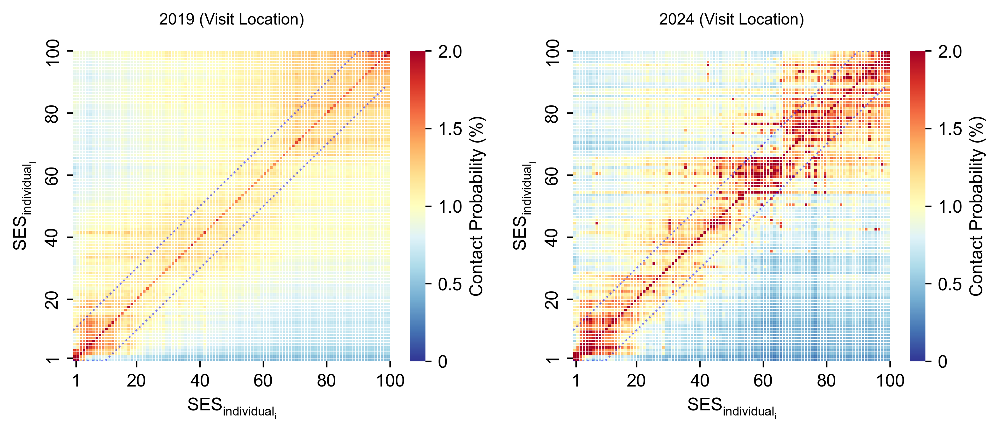

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.5), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_flow1903_m_visit*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_flow2403_m_visit*100, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Visit Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Visit Location)', fontsize=9, pad=15)

plt.tight_layout()
# plt.savefig('fig1b(visit).png', dpi=500, bbox_inches='tight')
plt.show()

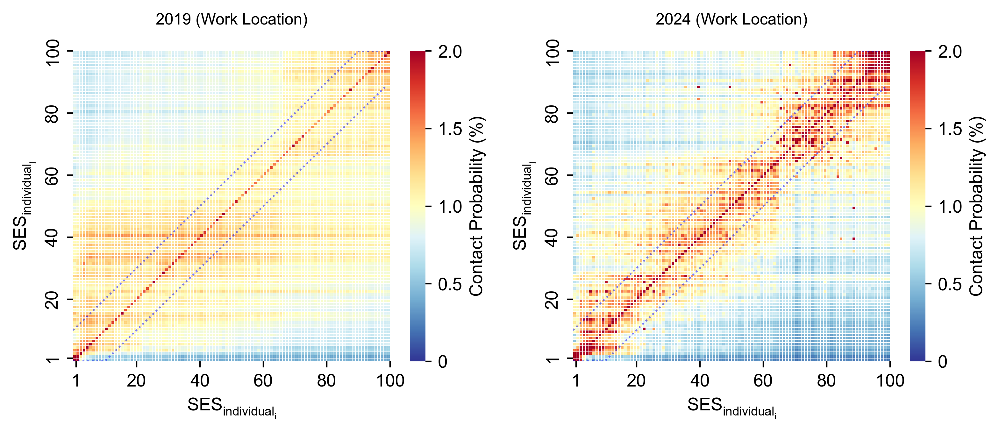

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.5), sharey=False)
axs = axs.flatten()

plot_visit_prefer(visit_flow1903_m_work*100, axs[0], add_colorbar=True)
plot_visit_prefer(visit_flow2403_m_work*100, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Work Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Work Location)', fontsize=9, pad=15)

plt.tight_layout()
# plt.savefig('fig1b(work).png', dpi=500, bbox_inches='tight')
plt.show()

In [33]:
cal_SE_index(np.nan_to_num(visit_flow1903_m.to_numpy()))

0.2344460804128639

In [34]:
cal_SE_index(np.nan_to_num(visit_flow2403_m.to_numpy()))

0.3113285265413769

In [35]:
cal_SE_index(np.nan_to_num(visit_flow2403_m_visit.to_numpy()))

0.3131798505353862

In [36]:
cal_SE_index(np.nan_to_num(visit_flow1903_m_work.to_numpy()))

0.23435445390037024

In [37]:
cal_SE_index(np.nan_to_num(visit_flow2403_m_work.to_numpy()))

0.3239966650119384

In [38]:
def plot_visit_ses_prob(od_data, ax, add_colorbar=False):

    out_df = data_prepross(od_data)
    house_price_pop_ses = house_price_pop[['home_grid', 'ses']].rename(columns={'ses': 'price_rank'})
    out_df_ses = out_df.loc[ (out_df['home_grid'] != out_df['visit_grid'])] \
        .merge(house_price_pop_ses.rename(columns={'home_grid': 'home_grid', 'price_rank': 'price_rank_i'})) \
        .merge(house_price_pop_ses.rename(columns={'home_grid': 'visit_grid', 'price_rank': 'price_rank_j'}))
    visit_ses = out_df_ses.groupby(['price_rank_i', 'price_rank_j'], as_index=False)[['stay_fre', 'sum_time']].sum()
    visit_ses_sum_home = visit_ses.groupby('price_rank_i', as_index=False).sum().rename(columns={'sum_time': 'time_sum', 'stay_fre': 'fre_sum'}).drop('price_rank_j', axis=1)
    visit_ses_prob = visit_ses.merge(visit_ses_sum_home)
    visit_ses_prob['visit_time_prob'] = visit_ses_prob['sum_time'] / visit_ses_prob['time_sum']
    visit_ses_prob['visit_fre_prob'] = visit_ses_prob['stay_fre'] / visit_ses_prob['fre_sum']
    visit_ses_prob['ses_diff'] = visit_ses_prob['price_rank_i'] - visit_ses_prob['price_rank_j']

    sc = ax.scatter(visit_ses_prob["ses_diff"], visit_ses_prob["visit_time_prob"], s=10, c=visit_ses_prob["price_rank_j"], cmap="RdYlBu_r", alpha=0.9)
    ax.set_xlabel(r'$\mathregular{SES_{differences}}$')
    ax.set_ylabel("Visit Probability")
    ax.axvline(x=0, color='black', linestyle='--', linewidth=0.9)

    for ses_diff_sign, color, pos in [(1, 'red', (0.95, 0.95)), (-1, 'blue', (0.05, 0.95))]:
        subset = visit_ses_prob[visit_ses_prob['ses_diff'] * ses_diff_sign > 0]
        subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
        
        coeff = np.polyfit(subset['ses_diff'], subset['log_visit_time_prob'], 1)
        y_pred = np.polyval(coeff, subset['ses_diff'])
        
        SS_res = np.sum((subset['log_visit_time_prob'] - y_pred)**2)
        SS_tot = np.sum((subset['log_visit_time_prob'] - np.mean(subset['log_visit_time_prob']))**2)
        r_squared = 1 - (SS_res / SS_tot)
        
        x = np.linspace(subset['ses_diff'].min(), subset['ses_diff'].max(), 100)
        y = np.exp(np.polyval(coeff, x))
        ax.plot(x, y, color=color, linestyle='--')
        
        text = r"$Slope = {0:.3f}$" "\n" r"$R^2 = {1:.3f}$".format(coeff[0], r_squared)
        ax.text(pos[0], pos[1], text, transform=ax.transAxes,
                color=color, ha='right' if ses_diff_sign==1 else 'left',
                va='top', fontsize=8)

    ax.set_yscale("log")
    
    if add_colorbar:
        cbar = fig.colorbar(sc, ax=ax, shrink=1)
        cbar.set_label(r'$\mathregular{SES_{place}}$')
        cbar.outline.set_visible(False)
        cbar.set_ticks([1,20,40,60,80,100])
        cbar.set_ticklabels([1,20,40,60,80,100])

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

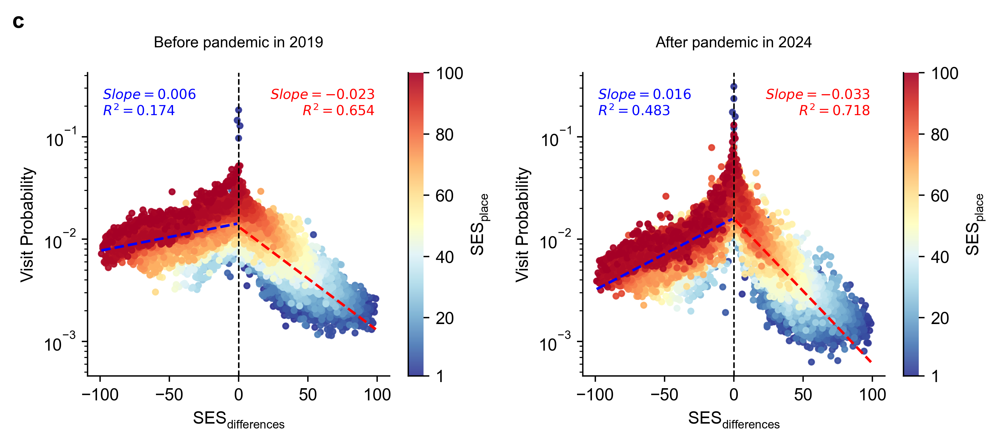

In [39]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

plot_visit_ses_prob(od1903, axs[0], add_colorbar=True)
plot_visit_ses_prob(od2403, axs[1], add_colorbar=True)

axs[0].set_title('Before pandemic in 2019', fontsize=9, pad=15)
axs[1].set_title('After pandemic in 2024', fontsize=9, pad=15)

axs[0].text(-0.25, 1.2, 'c', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1c.pdf', dpi=500, bbox_inches='tight')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

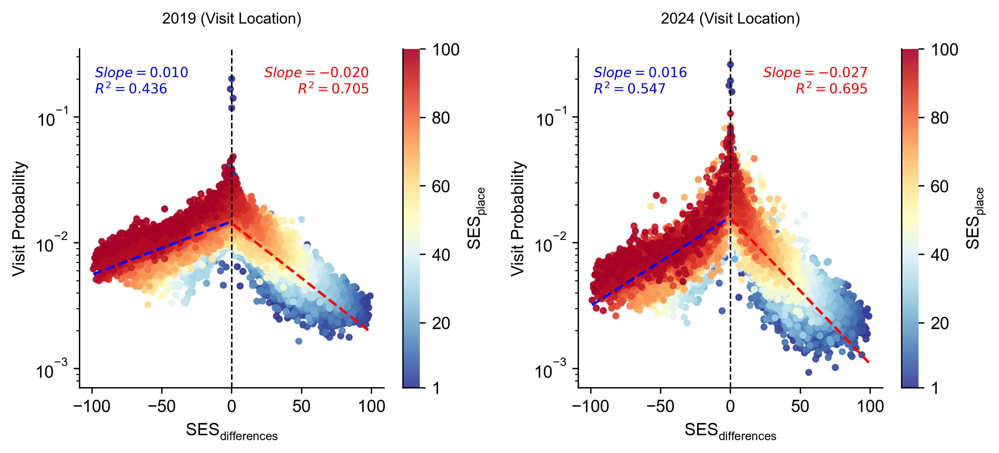

In [40]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

plot_visit_ses_prob(od1903.loc[od1903['ptype']==0], axs[0], add_colorbar=True)
plot_visit_ses_prob(od2403.loc[od2403['ptype']==0], axs[1], add_colorbar=True)

axs[0].set_title('2019 (Visit Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Visit Location)', fontsize=9, pad=15)

# axs[0].text(-0.25, 1.2, 'c', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1c_visit.png', dpi=500, bbox_inches='tight')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_visit_time_prob'] = np.log(subset['visit_time_prob'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\3331207107.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

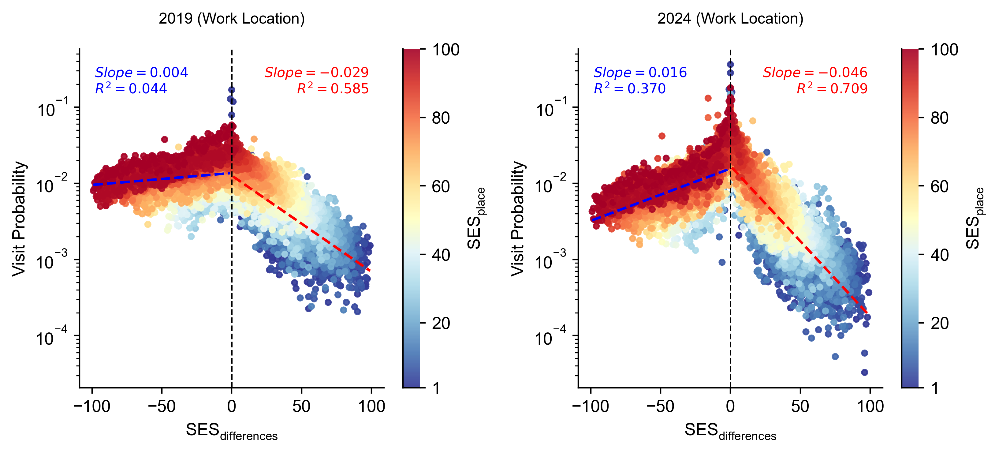

In [41]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

plot_visit_ses_prob(od1903.loc[od1903['ptype']==2], axs[0], add_colorbar=True)
plot_visit_ses_prob(od2403.loc[od2403['ptype']==2], axs[1], add_colorbar=True)

axs[0].set_title('2019 (Work Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Work Location)', fontsize=9, pad=15)

# axs[0].text(-0.25, 1.2, 'c', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1c_work.png', dpi=500, bbox_inches='tight')
plt.show()

In [42]:
def plot_ses_group_prob(data, ax, add_colorbar=False):
    
    sc = ax.scatter(data["ses_diff"], data["meet_prob_norm"], s=10, c=data["ses_meet"], cmap="RdYlBu_r", alpha=0.9)
    ax.set_xlabel(r'$\mathregular{SES_{differences}}$')
    ax.set_ylabel("Contact Probability")
    ax.axvline(x=0, color='black', linestyle='--', linewidth=0.9)


    for ses_diff_sign, color, pos in [(1, 'red', (0.95, 0.95)), (-1, 'blue', (0.05, 0.95))]:
        subset = data[data['ses_diff'] * ses_diff_sign > 0]
        subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
        
        coeff = np.polyfit(subset['ses_diff'], subset['log_meet_prob_norm'], 1)
        y_pred = np.polyval(coeff, subset['ses_diff'])
        
        SS_res = np.sum((subset['log_meet_prob_norm'] - y_pred)**2)
        SS_tot = np.sum((subset['log_meet_prob_norm'] - np.mean(subset['log_meet_prob_norm']))**2)
        r_squared = 1 - (SS_res / SS_tot)
        
        x = np.linspace(subset['ses_diff'].min(), subset['ses_diff'].max(), 100)
        y = np.exp(np.polyval(coeff, x))
        ax.plot(x, y, color=color, linestyle='--')
        
        text = r"$Slope = {0:.3f}$" "\n" r"$R^2 = {1:.3f}$".format(coeff[0], r_squared)
        ax.text(pos[0], pos[1], text, transform=ax.transAxes,
                color=color, ha='right' if ses_diff_sign==1 else 'left',
                va='top', fontsize=8)

    ax.set_yscale("log")
    
    if add_colorbar:
        cbar = fig.colorbar(sc, ax=ax, shrink=1)
        cbar.set_label(r'$\mathregular{SES_{individual}}$')
        cbar.outline.set_visible(False)
        cbar.set_ticks([1,20,40,60,80,100])
        cbar.set_ticklabels([1,20,40,60,80,100])

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

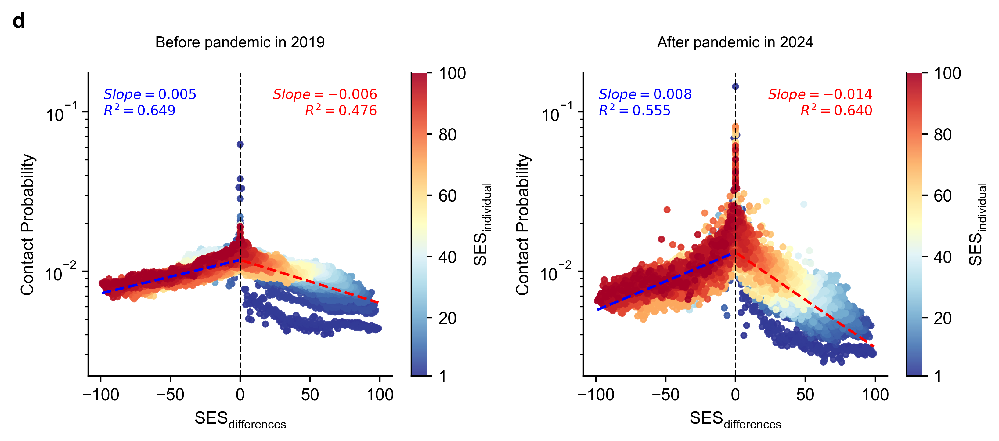

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

visit_flow1903['ses_diff'] = visit_flow1903['ses'] - visit_flow1903['ses_meet']
visit_flow2403['ses_diff'] = visit_flow2403['ses'] - visit_flow2403['ses_meet'] 

plot_ses_group_prob(visit_flow1903, axs[0], add_colorbar=True)
plot_ses_group_prob(visit_flow2403, axs[1], add_colorbar=True)

axs[0].set_title('Before pandemic in 2019', fontsize=9, pad=15)
axs[1].set_title('After pandemic in 2024', fontsize=9, pad=15)

axs[0].text(-0.25, 1.2, 'd', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1d.pdf', dpi=500, bbox_inches='tight')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

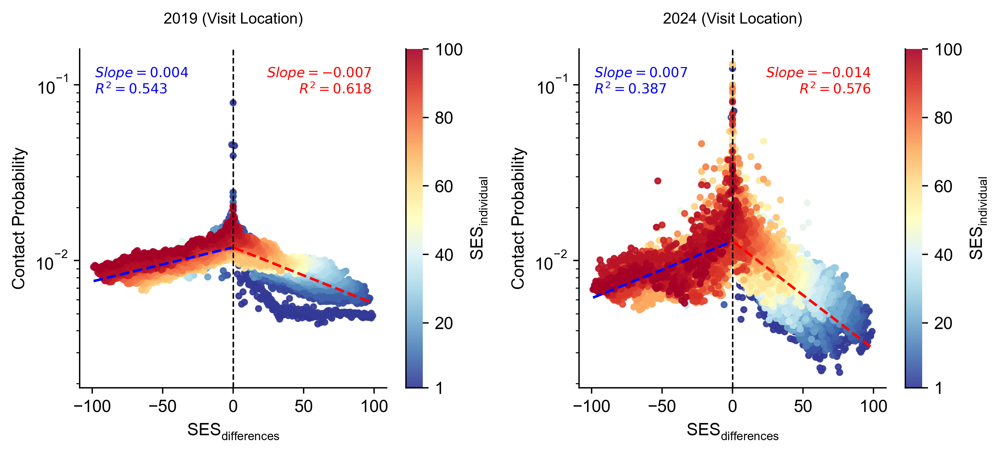

In [44]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

visit_flow1903_visit['ses_diff'] = visit_flow1903_visit['ses'] - visit_flow1903_visit['ses_meet']
visit_flow2403_visit['ses_diff'] = visit_flow2403_visit['ses'] - visit_flow2403_visit['ses_meet'] 

plot_ses_group_prob(visit_flow1903_visit, axs[0], add_colorbar=True)
plot_ses_group_prob(visit_flow2403_visit, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Visit Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Visit Location)', fontsize=9, pad=15)

# axs[0].text(-0.25, 1.2, 'd', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1d_visit.png', dpi=500, bbox_inches='tight')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['log_meet_prob_norm'] = np.log(subset['meet_prob_norm'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\4245859837.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

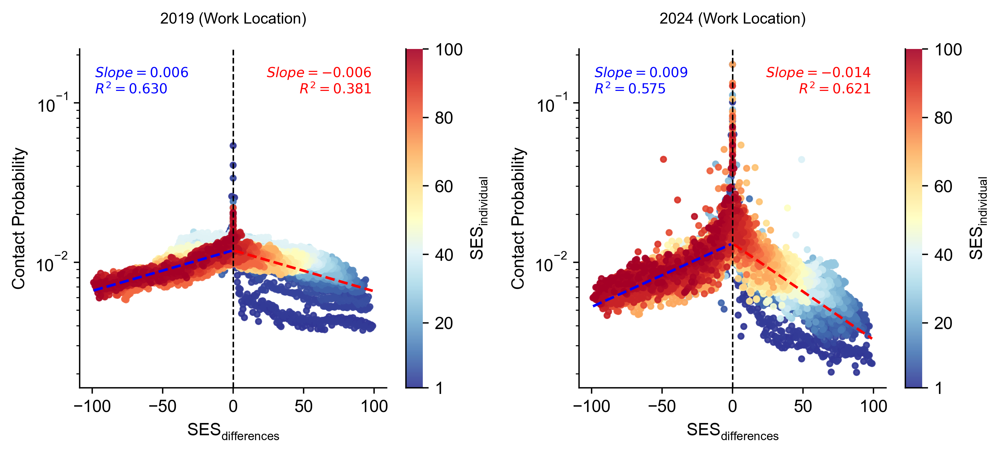

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(8.3, 3.8), sharey=False)
axs = axs.flatten()

visit_flow1903_work['ses_diff'] = visit_flow1903_work['ses'] - visit_flow1903_work['ses_meet']
visit_flow2403_work['ses_diff'] = visit_flow2403_work['ses'] - visit_flow2403_work['ses_meet'] 

plot_ses_group_prob(visit_flow1903_work, axs[0], add_colorbar=True)
plot_ses_group_prob(visit_flow2403_work, axs[1], add_colorbar=True)

axs[0].set_title('2019 (Work Location)', fontsize=9, pad=15)
axs[1].set_title('2024 (Work Location)', fontsize=9, pad=15)

# axs[0].text(-0.25, 1.2, 'd', transform=axs[0].transAxes, fontsize=13, fontweight='bold', va='top', ha='left')
axs[0].sharey(axs[1]) 
sns.despine()

plt.tight_layout()
# plt.savefig('fig1d_work.png', dpi=500, bbox_inches='tight')
plt.show()

In [46]:
visit_ses_geo1903 = cal_visit_ses(od1903)
visit_ses_geo2403 = cal_visit_ses(od2403)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\592126125.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\592126125.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(wei

In [47]:
points = gpd.GeoSeries(
    [Point(-73.5, 40.5), Point(-74.5, 40.5)], crs=4326
)  # Geographic WGS 84 - degrees
points = points.to_crs(32619)  # Projected WGS 84 - meters
distance_meters = points[0].distance(points[1])

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\978650756.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
D:\ProgramData\Anaconda3\envs\geo310\lib\site-packages\matplotlib_scalebar\scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(


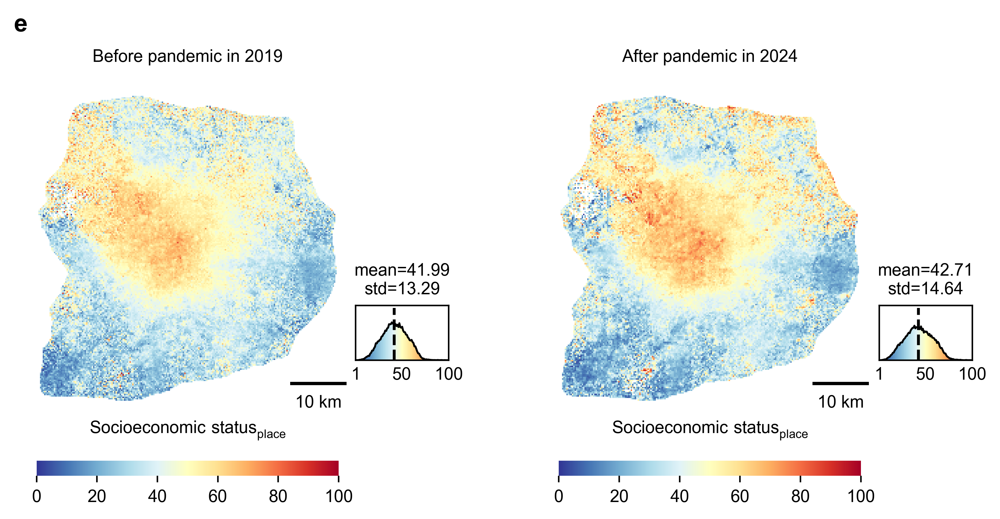

In [48]:
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 500,
    'font.size': 9
})


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8.5, 4)) 
visit_ses_geo1903.plot(ax=ax1, column='avg_ses', cmap='RdYlBu_r', legend=False, vmin=0, vmax=100)
visit_ses_geo2403.plot(ax=ax2, column='avg_ses', cmap='RdYlBu_r', legend=False, vmin=0, vmax=100)

ax1.add_artist(ScaleBar(distance_meters, location="lower right"))
ax2.add_artist(ScaleBar(distance_meters, location="lower right"))

cmaps = 'RdYlBu_r'
norm = plt.Normalize(vmin=0, vmax=100)
sm = plt.cm.ScalarMappable(cmap=cmaps, norm=norm)
sm.set_array([]) 

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, pad=0.10, ax=ax1)
cbar.set_label(r'$\mathregular{Socioeconomic\ status_{place}}$', size=9, labelpad=-45) 
cbar.outline.set_visible(False)

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, pad=0.10, ax=ax2)
cbar.set_label(r'$\mathregular{Socioeconomic\ status_{place}}$', size=9, labelpad=-45) 
cbar.outline.set_visible(False)

ax1.set_axis_off()
ax2.set_axis_off()

ax1.set_title('Before pandemic in 2019', fontsize=9, pad=10)
ax2.set_title('After pandemic in 2024', fontsize=9, pad=10)

ax1.text(-0.03, 1.2, 'e', transform=ax1.transAxes, fontsize=13, fontweight='bold', va='top', ha='left')


def plot_subplot(fig, samples, position):
    ax_sub = fig.add_axes(position, label='subplot')
    n, bins, _ = ax_sub.hist(samples, np.linspace(1, 100, 100), density=1, alpha=0)
    x = bins[:-1] + np.diff(bins) / 2
    norm = colors.Normalize(vmin=1, vmax=100)
    cmap = cm.RdYlBu_r
    for xi, ni in zip(x, n):
        color = cmap(norm(xi))
        ax_sub.bar(xi, ni, width=np.diff(bins)[0], color=color, edgecolor='none')
    ax_sub.plot(x, n, 'k', linewidth=1)
    mean_val = samples.mean()
    ax_sub.plot([mean_val, mean_val], [0, 0.04], 'k--')
    ax_sub.tick_params(bottom=False, top=False, left=False, right=False, pad=0)
    ax_sub.set(
        xticks=[1, 50, 100],
        xticklabels=[1, 50, 100],
        yticklabels=[],
        xlim=(1, 100)
    )
    ax_sub.set_title(f'mean={mean_val:.2f}\nstd={np.std(samples):.2f}', fontsize=9)

samples_1903 = visit_ses_geo1903['avg_ses'].to_numpy()
plot_subplot(fig, samples_1903, [0.42, 0.34, 0.08, 0.1])

samples_2403 = visit_ses_geo2403['avg_ses'].to_numpy()
plot_subplot(fig, samples_2403, [0.87, 0.34, 0.08, 0.1])

plt.tight_layout()
# plt.savefig('fig1e.pdf', dpi=500, bbox_inches='tight')
plt.show()

In [49]:
def ses_isolation(time_seq):
    time_seq = np.array(time_seq)
    time_seq = time_seq/time_seq.sum()
    n = len(time_seq)
    ses_d = n/(2*n-2)*(np.abs(np.array(time_seq) - 1/n)).sum()
    return ses_d

ses_isolation(np.array([0.25,0.25,0.25,0.25]))

def visit_isolation(data):
    data_new = data_prepross(data)
    data_visit = data_new.loc[(data_new['ptype']!=1) & (data_new['visit_grid'].isin(sixth_fnid))]
    visit_grid_sum = data_visit.loc[:,['visit_grid','sum_time']].groupby(['visit_grid'], as_index=False).sum()
    visit_grid_ses_sum = data_visit.loc[:,['visit_grid','ses2','sum_time']].groupby(['visit_grid','ses2'], as_index=False).sum()
    visit_grid_ses_merge = visit_grid_ses_sum.merge(visit_grid_sum, on='visit_grid', suffixes=('_ses',''))
    visit_grid_ses_merge['grid_ses_prob'] = visit_grid_ses_merge['sum_time_ses']/visit_grid_ses_merge['sum_time']
    iso_array = []
    iso_len = len(np.unique(data_visit['ses2']))
    for visit_grid in tqdm(data_visit['visit_grid'].unique()):
        ses_contact_array = np.array(visit_grid_ses_merge.loc[visit_grid_ses_merge['visit_grid']==visit_grid, ['grid_ses_prob']]).T[0]
        
        ses_contact_array = np.pad(ses_contact_array, (0, iso_len-len(ses_contact_array)), mode='constant', constant_values=0)
        isolation = ses_isolation(ses_contact_array)
        iso_array.append(isolation)
    
    visit_iso_df = pd.DataFrame({'visit_grid':data_visit['visit_grid'].unique(),
                            'isolation':iso_array})
    
    return visit_iso_df

visit_iso1903 = visit_isolation(od1903)
visit_iso2403 = visit_isolation(od2403)

100%|███████████████████████████████████████████████████████████████████████████| 36398/36398 [01:00<00:00, 605.10it/s]


In [50]:
visit_iso = visit_iso2403.merge(visit_iso1903, on=['visit_grid'], suffixes=('_2403','_1903'))
visit_iso_geo = visit_iso.loc[visit_iso['visit_grid'].isin(sixth_fnid)].merge(city_grid.loc[:,['fnid','geometry']], left_on='visit_grid',right_on='fnid')
visit_iso_geo = gpd.GeoDataFrame(visit_iso_geo, geometry='geometry', crs='EPSG:4326')

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\2338251351.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
D:\ProgramData\Anaconda3\envs\geo310\lib\site-packages\matplotlib_scalebar\scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(


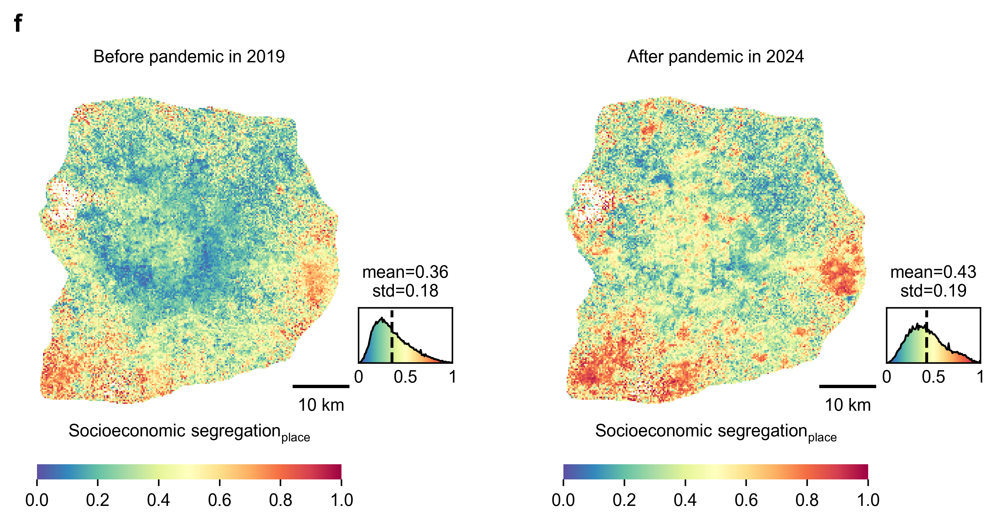

In [51]:
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 500,
    'font.size': 9
})


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8.5, 4)) 
visit_iso_geo.plot(ax=ax1, column='isolation_1903', cmap='Spectral_r', legend=False, vmin=0, vmax=1)
visit_iso_geo.plot(ax=ax2, column='isolation_2403', cmap='Spectral_r', legend=False, vmin=0, vmax=1)

ax1.add_artist(ScaleBar(distance_meters, location="lower right"))
ax2.add_artist(ScaleBar(distance_meters, location="lower right"))

cmaps = 'Spectral_r'
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cmaps, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, pad=0.1, ax=ax1)
cbar.set_label(r'$\mathregular{Socioeconomic\ segregation_{place}}$', size=9, labelpad=-45)
cbar.outline.set_visible(False)

cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.5, pad=0.1, ax=ax2)
cbar.set_label(r'$\mathregular{Socioeconomic\ segregation_{place}}$', size=9, labelpad=-45)
cbar.outline.set_visible(False)


ax1.set_axis_off()
ax2.set_axis_off()

ax1.set_title('Before pandemic in 2019', fontsize=9, pad=10)
ax2.set_title('After pandemic in 2024', fontsize=9, pad=10)

ax1.text(-0.03, 1.2, 'f', transform=ax1.transAxes, fontsize=13, fontweight='bold', va='top', ha='left')

def plot_subplot(fig, samples, position):
    ax_sub = fig.add_axes(position, label='subplot')
    n, bins, _ = ax_sub.hist(samples, np.linspace(0, 1, 100), density=1, alpha=0)
    x = bins[:-1] + np.diff(bins) / 2
    norm = colors.Normalize(vmin=0, vmax=1)
    cmap = cm.Spectral_r
    for xi, ni in zip(x, n):
        color = cmap(norm(xi))
        ax_sub.bar(xi, ni, width=np.diff(bins)[0], color=color, edgecolor='none')
    ax_sub.plot(x, n, 'k', linewidth=1)
    mean_val = samples.mean()
    ax_sub.plot([mean_val, mean_val], [0, 3], 'k--')
    ax_sub.tick_params(bottom=False, top=False, left=False, right=False, pad=0)
    ax_sub.set(
        xticks=[0, 0.5, 1],
        xticklabels=[0, 0.5, 1],
        yticklabels=[],
        xlim=(0, 1)
    )
    ax_sub.set_title(f'mean={mean_val:.2f}\nstd={np.std(samples):.2f}', fontsize=9)

samples_1903 = visit_iso_geo['isolation_1903'].to_numpy()
plot_subplot(fig, samples_1903, [0.42, 0.34, 0.08, 0.1])

samples_2403 = visit_iso_geo['isolation_2403'].to_numpy()
plot_subplot(fig, samples_2403, [0.87, 0.34, 0.08, 0.1])

plt.tight_layout()
# plt.savefig('fig1f.pdf', dpi=500, bbox_inches='tight')
plt.show()

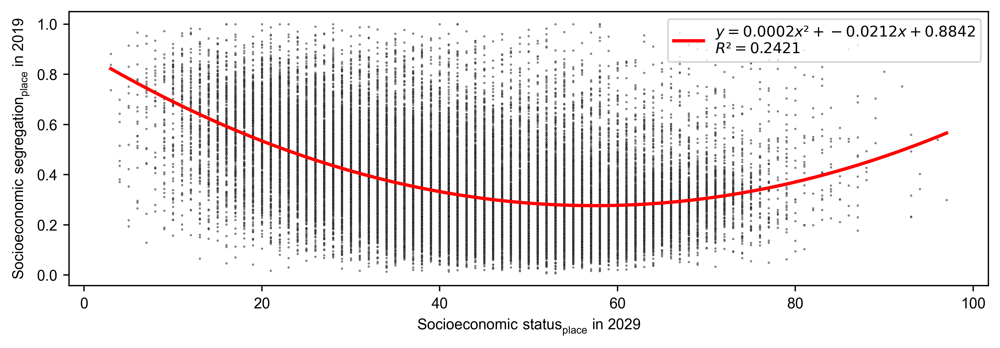

In [52]:
a = visit_ses_geo1903.drop('geometry',axis=1).merge(visit_ses_geo2403.drop('geometry',axis=1), on=['fnid'], suffixes=('_2403','_1903') ).merge(visit_iso.rename(columns={'visit_grid':'fnid'}))
x = a['avg_ses_1903']
y = a['isolation_1903']

# Quadratic fit (degree=2)
coeffs = np.polyfit(x, y, 2)
poly = np.poly1d(coeffs)
x_fit = np.linspace(x.min(), x.max(), 100)

plt.figure(figsize=(10, 3))
plt.scatter(x, y, color='gray', edgecolors='black', 
            linewidths=0.3, s=1, alpha=0.6)
plt.plot(x_fit, poly(x_fit), 'r-', lw=2,
         label=f'$y = {coeffs[0]:.4f}x² + {coeffs[1]:.4f}x + {coeffs[2]:.4f}$\n$R² = {r2_score(y, poly(x)):.4f}$')

plt.xlabel(r'$\mathregular{Socioeconomic\ status_{place}}$ in 2029')
plt.ylabel(r'$\mathregular{Socioeconomic\ segregation_{place}}$ in 2019')
plt.legend()
# plt.savefig('fig_s3a.png', dpi=500, bbox_inches='tight')
plt.show()

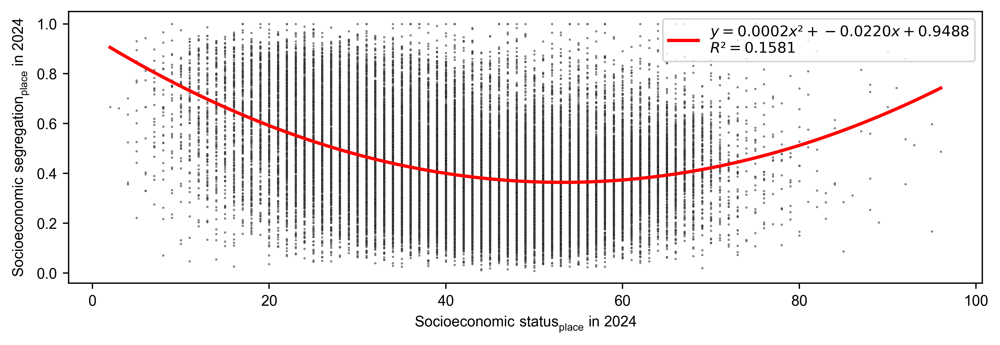

In [53]:
x = a['avg_ses_2403']
y = a['isolation_2403']

# Quadratic fit (degree=2)
coeffs = np.polyfit(x, y, 2)
poly = np.poly1d(coeffs)
x_fit = np.linspace(x.min(), x.max(), 100)

plt.figure(figsize=(10, 3))
plt.scatter(x, y, color='gray', edgecolors='black', 
            linewidths=0.3, s=1, alpha=0.6)
plt.plot(x_fit, poly(x_fit), 'r-', lw=2,
         label=f'$y = {coeffs[0]:.4f}x² + {coeffs[1]:.4f}x + {coeffs[2]:.4f}$\n$R² = {r2_score(y, poly(x)):.4f}$')

plt.xlabel(r'$\mathregular{Socioeconomic\ status_{place}}$ in 2024')
plt.ylabel(r'$\mathregular{Socioeconomic\ segregation_{place}}$ in 2024')
plt.legend()
# plt.savefig('fig_s3b.png', dpi=500, bbox_inches='tight')
plt.show()

In [56]:
a = pd.read_excel(os.path.join(root, 'data', 'rent_price_beijing.xlsx')).dropna()
a['price'] = a['租金'].str.replace('元/月', '').astype(int)
b = a.loc[a['租赁方式']=='整租',['租金', 'wgs84_lng', 'wgs84_lat']].dropna()
b['price'] = b['租金'].str.replace('元/月', '').astype(int)
b.loc[:,['price','wgs84_lng','wgs84_lat']]
geometry = [Point(xy) for xy in zip(b['wgs84_lng'], b['wgs84_lat'])]
gdf = gpd.GeoDataFrame(b, geometry=geometry, crs="EPSG:4326")  # WGS84
# gdf.plot(column='price', markersize=1, legend=True)
price_grid = city_grid.loc[:,['fnid','geometry']].merge(house_price_pop.loc[:,['home_grid','price']].rename(columns={'home_grid':'fnid'}))
# price_grid.plot(column='price')
visit_ses_geo2403 = pd.read_csv(os.path.join(root, 'data','visit_ses_geo2403_six.csv'))
visit_ses = city_grid.loc[:,['fnid','geometry']].merge(visit_ses_geo2403.rename(columns={'visit_grid':'fnid'}))

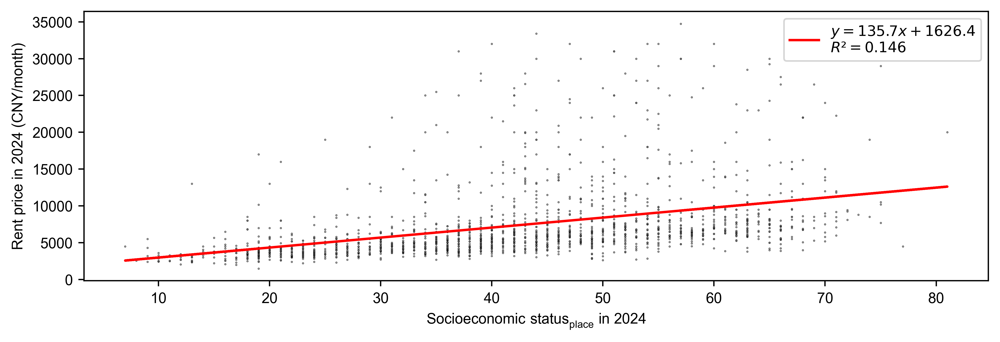

In [57]:
joined_data = gdf.sjoin(visit_ses, predicate='intersects').loc[:,['fnid','avg_ses','price']].groupby('fnid', as_index=False).median().sort_values('price')
joined_data = joined_data.loc[joined_data['price']<35000]

# Linear fit
x = joined_data['avg_ses']
y = joined_data['price']
coeffs = np.polyfit(x, y, 1)
poly = np.poly1d(coeffs)

plt.figure(figsize=(10, 3))
plt.scatter(x, y, color='gray', edgecolors='black', 
            linewidths=0.3, s=1, alpha=0.6)
plt.plot(x, poly(x), 'r-', 
         label=f'$y = {coeffs[0]:.1f}x + {coeffs[1]:.1f}$\n$R² = {r2_score(y, poly(x)):.3f}$')
plt.xlabel(r'$\mathregular{Socioeconomic\ status_{place}}$ in 2024')
plt.ylabel("Rent price in 2024 (CNY/month)")
plt.legend()
# plt.savefig('.png', dpi=500, bbox_inches='tight')
plt.show()

In [58]:
def data_prepross(df):
    visit_count = df.loc[:,['visit_grid','home_grid']].groupby('visit_grid', as_index=False).count()
    df = df.loc[df['visit_grid'].isin(np.array(visit_count.loc[visit_count['home_grid']>=3]['visit_grid']))]
    df = df.loc[df['gender'].isin([1,2])]
    visit_fre = od1903.loc[:,['home_grid','stay_fre']].groupby('home_grid', as_index=False).sum()
    df = df.loc[df['home_grid'].isin(visit_fre.loc[visit_fre['stay_fre']>60]['home_grid'])]
    df = df.loc[df['age'].isin(['a1','a2','a3','a4','a5','a6','a7'])]
    diverse_visits = df.groupby(['visit_grid', 'home_grid', 'age', 'gender', 'is_local']).size().reset_index(name='count')
    valid_visit_grids = diverse_visits.groupby('visit_grid')['count'].count()
    valid_visit_grids = valid_visit_grids[valid_visit_grids >= 10].index
    df = df.loc[df['visit_grid'].isin(valid_visit_grids)]
    df.loc[(df['home_grid']==df['visit_grid']) & (df['ptype']!=1), 'ptype'] = 1
    df_ses = df.merge(house_price_pop.loc[:,['home_grid','ses','ses2', 'ses3']])
    return df_ses

def visit_ses_prob(data):
    data_new = data_prepross(data)
    data_new = data_new.merge(od_line_geo)
    data_visit = data_new.loc[
        (data_new['ptype']!=1) & 
        (data_new['visit_grid'].isin(sixth_fnid)) & 
        (data_new['distance']>250)
    ]
    data_group_sum = data_visit.loc[:,['ses2','visit_grid','sum_time']].groupby(['ses2','visit_grid'], as_index=False).sum()
    data_sum = data_visit.loc[:,['ses2','sum_time']].groupby('ses2', as_index=False).sum()
    data_group_sum = data_group_sum.merge(data_sum, on='ses2', suffixes=('', '_sum'))
    data_group_sum['visit_prob'] = data_group_sum['sum_time']/data_group_sum['sum_time_sum']
    
    return data_group_sum.loc[:,['ses2','visit_grid','visit_prob']]

visit_ses_prob1903 = visit_ses_prob(od1903)
visit_ses_prob2403 = visit_ses_prob(od2403)

In [59]:
visit_ses_prob_merge = visit_ses_prob1903.merge(visit_ses_prob2403, on=(['ses2','visit_grid']), suffixes=('_1903','_2403'))
visit_ses_prob_merge['visit_prob_change'] = (visit_ses_prob_merge['visit_prob_2403'] - visit_ses_prob_merge['visit_prob_1903']) / (visit_ses_prob_merge['visit_prob_1903'])
visit_ses_prob_geo = city_grid.loc[:,['fnid','geometry']].merge(visit_ses_prob_merge, left_on='fnid', right_on='visit_grid')

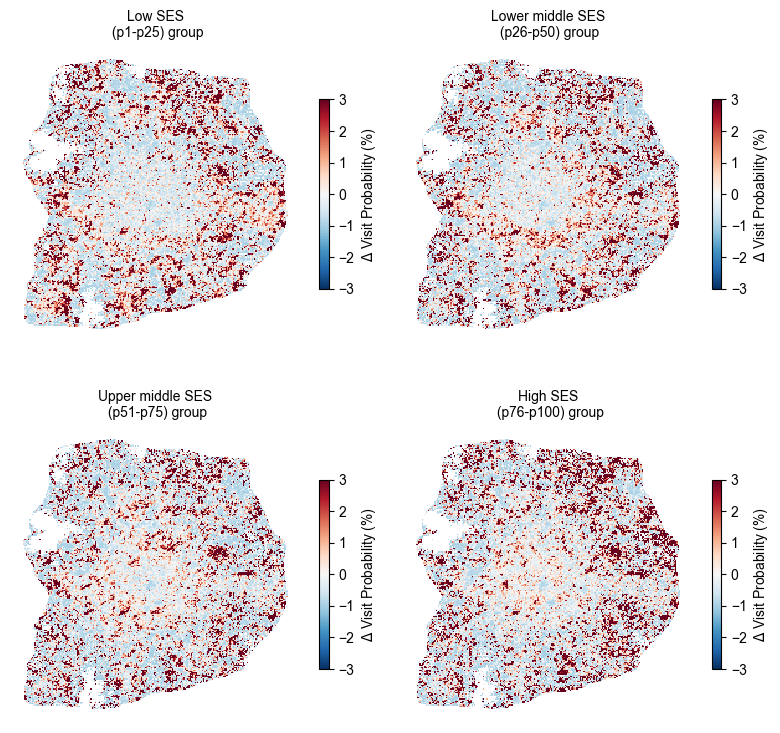

In [60]:
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 100,
    'font.size': 10
})
legend_kwds={"shrink": 0.5, "label": r'$\mathregular{\Delta}$ Visit Probability (%)'}
title = ['Low SES\n (p1-p25)', 'Lower middle SES\n (p26-p50)', 'Upper middle SES\n (p51-p75)', 'High SES\n (p76-p100)']
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
for i in range(4):
    visit_ses_prob_geo.loc[visit_ses_prob_geo['ses2']==i+1].plot(column='visit_prob_change', legend=True, cmap='RdBu_r',vmin=-3, vmax=3, legend_kwds=legend_kwds,ax=axs[i//2,i%2])
    axs[i//2,i%2].set_title(title[i]+' group', fontsize=10)
    axs[i//2,i%2].set_axis_off()

plt.tight_layout()
# plt.savefig('.png', dpi=500, bbox_inches='tight')
plt.show()

In [61]:
def weighted_avg(group, col, weight_col):
    return (group[col] * group[weight_col]).sum() / group[weight_col].sum()

def cal_visit_ses(od_data):
    data_new = data_prepross(od_data)
    # data_visit = data_new.loc[data_new['ptype']!=1]
    data_att = data_new.merge(od_line_geo, on=['home_grid', 'visit_grid'])
    data_visit = data_att.loc[(data_att['ptype']!=1) & (data_att['distance']>365)]
    # 修改为访问点的SES
    data_visit_time = data_visit.loc[:,['visit_grid','ses','sum_time']].groupby(['visit_grid','ses'], as_index=False).sum()
    data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
    data_visit_grid_attr['avg_ses'] = data_visit_grid_attr['avg_ses'].apply(round) # lambda x: np.ceil(x/10).astype(int)
    return city_grid.loc[:,['fnid','geometry']].merge(data_visit_grid_attr.rename(columns={'visit_grid':'fnid'}))

In [62]:
visit_ses_geo1903 = cal_visit_ses(od1903)
visit_ses_geo2403 = cal_visit_ses(od2403)

C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\1428010638.py:11: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply(weighted_avg, 'ses', 'sum_time').reset_index(name='avg_ses')
C:\Users\DELL\AppData\Local\Temp\ipykernel_37700\1428010638.py:11: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_visit_grid_attr = data_visit_time.groupby('visit_grid').apply

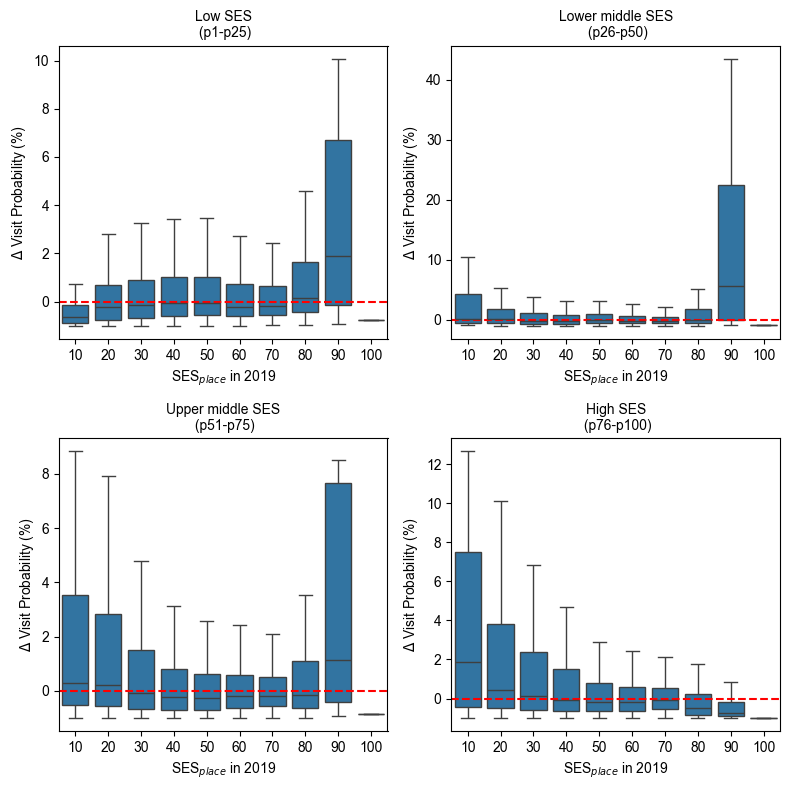

In [63]:
visit_ses_prob_merge = visit_ses_prob_merge.merge(visit_ses_geo1903.loc[:,['fnid','avg_ses']].rename(columns={'fnid':'visit_grid'}))
visit_ses_prob_merge['avg_ses_'] = visit_ses_prob_merge['avg_ses'].apply(lambda x: int(x/10+1)*10)
X_TICKS = [1,10,20,30,40,50,60,70,80,90]
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
ax = axs.flatten()
title = ['Low SES\n (p1-p25)', 'Lower middle SES\n (p26-p50)', 'Upper middle SES\n (p51-p75)', 'High SES\n (p76-p100)']
for i in range(4):
    sns.boxplot(data=visit_ses_prob_merge.loc[visit_ses_prob_merge['ses2']==i+1], x='avg_ses_', y='visit_prob_change', ax=ax[i], showfliers=False)
    ax[i].set_xlabel(r"$\mathregular{SES}_{place}$"+" in 2019")
    ax[i].set_ylabel(r'$\mathregular{\Delta}$ Visit Probability (%)')
    ax[i].set_title(title[i], fontsize=10)
    ax[i].axhline(0, linestyle='--', linewidth=1.5, color='red')

plt.tight_layout()
# plt.savefig('visit_prob_change_place2019.png', dpi=500, bbox_inches='tight')
plt.show()

In [64]:
visit_ses_prob_merge = visit_ses_prob1903.merge(visit_ses_prob2403, on=(['ses2','visit_grid']), suffixes=('_1903','_2403'))
visit_ses_prob_merge['visit_prob_change'] = (visit_ses_prob_merge['visit_prob_2403'] - visit_ses_prob_merge['visit_prob_1903']) / (visit_ses_prob_merge['visit_prob_1903'])
visit_ses_prob_geo = city_grid.loc[:,['fnid','geometry']].merge(visit_ses_prob_merge, left_on='fnid', right_on='visit_grid')

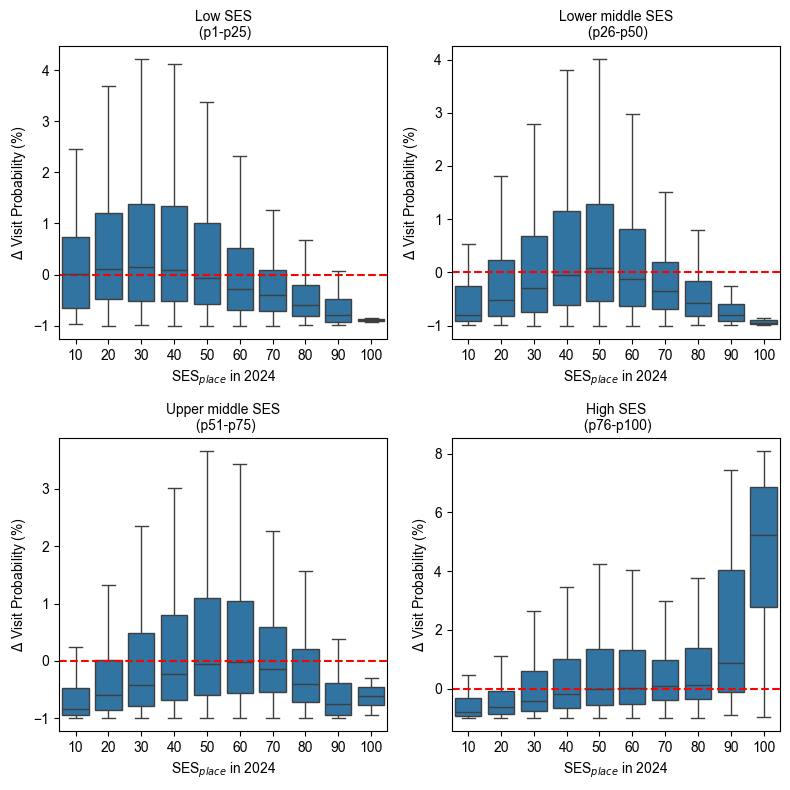

In [65]:
visit_ses_prob_merge = visit_ses_prob_merge.merge(visit_ses_geo2403.loc[:,['fnid','avg_ses']].rename(columns={'fnid':'visit_grid'}))
visit_ses_prob_merge['avg_ses_'] = visit_ses_prob_merge['avg_ses'].apply(lambda x: int(x/10+1)*10)
X_TICKS = [1,10,20,30,40,50,60,70,80,90]
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
ax = axs.flatten()
title = ['Low SES\n (p1-p25)', 'Lower middle SES\n (p26-p50)', 'Upper middle SES\n (p51-p75)', 'High SES\n (p76-p100)']
for i in range(4):
    sns.boxplot(data=visit_ses_prob_merge.loc[visit_ses_prob_merge['ses2']==i+1], x='avg_ses_', y='visit_prob_change', ax=ax[i], showfliers=False)
    ax[i].set_xlabel(r"$\mathregular{SES}_{place}$"+" in 2024")
    ax[i].set_ylabel(r'$\mathregular{\Delta}$ Visit Probability (%)')
    ax[i].set_title(title[i], fontsize=10)
    ax[i].axhline(0, linestyle='--', linewidth=1.5, color='red')

plt.tight_layout()
# plt.savefig('visit_prob_change_place2024.png', dpi=500, bbox_inches='tight')
plt.show()

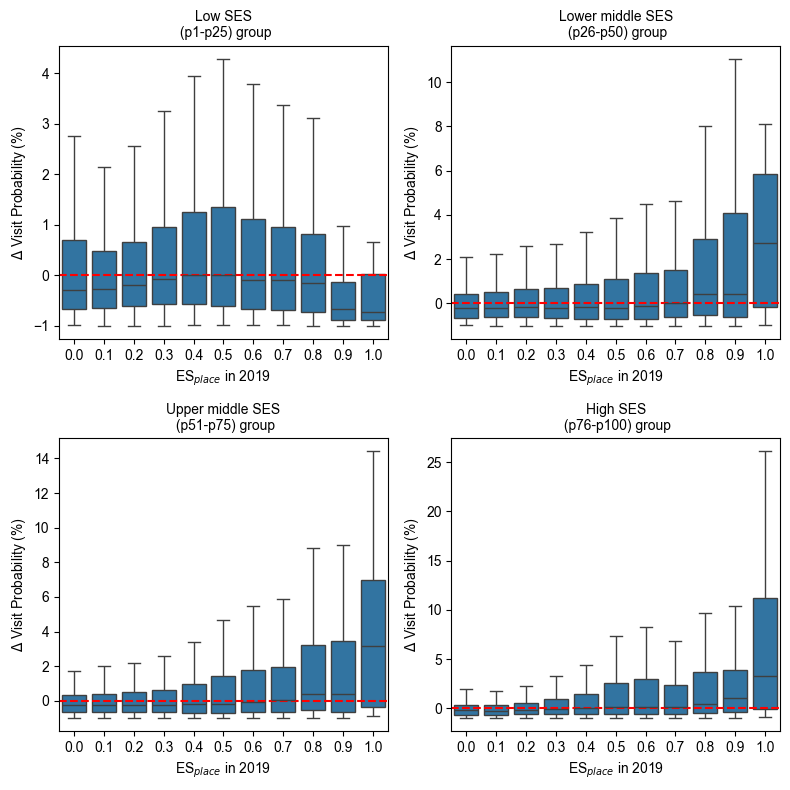

In [66]:
visit_ses_prob_ = visit_ses_prob_merge.merge(visit_iso)
visit_ses_prob_['isolation_1903'] = visit_ses_prob_['isolation_1903'].apply(lambda x: round(x,1))
# X_TICKS = [1,10,20,30,40,50,60,70,80,90]

fig, axs = plt.subplots(2, 2, figsize=(8, 8))
ax = axs.flatten()
for i in range(4):
    sns.boxplot(data=visit_ses_prob_.loc[visit_ses_prob_['ses2'] == i + 1], x='isolation_1903', y='visit_prob_change', ax=ax[i], showfliers=False)
    ax[i].set_xlabel(r"$\mathregular{ES}_{place}$" + " in 2019")
    ax[i].set_ylabel(r'$\mathregular{\Delta}$ Visit Probability (%)')
    ax[i].set_title(title[i] + ' group', fontsize=10)
    ax[i].axhline(0, linestyle='--', linewidth=1.5, color='red')

plt.tight_layout()
# plt.savefig('visit_prob_change_es2019.png', dpi=500, bbox_inches='tight')
plt.show()

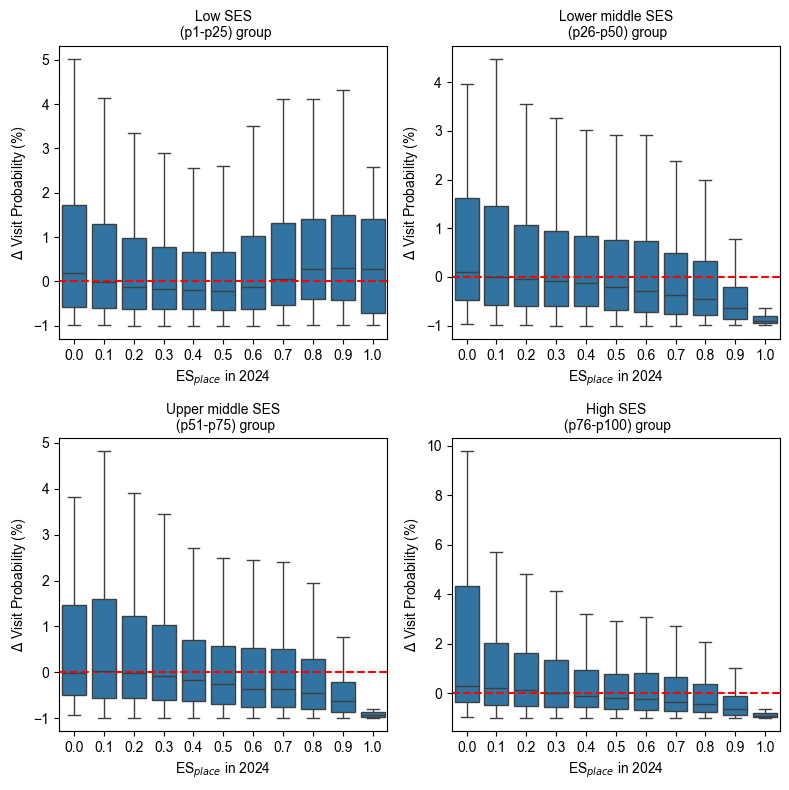

In [67]:
visit_ses_prob_ = visit_ses_prob_merge.merge(visit_iso)
visit_ses_prob_['isolation_2403'] = visit_ses_prob_['isolation_2403'].apply(lambda x: round(x,1))
# X_TICKS = [1,10,20,30,40,50,60,70,80,90]

fig, axs = plt.subplots(2, 2, figsize=(8, 8))
ax = axs.flatten()
for i in range(4):
    sns.boxplot(data=visit_ses_prob_.loc[visit_ses_prob_['ses2'] == i + 1], x='isolation_2403', y='visit_prob_change', ax=ax[i], showfliers=False)
    ax[i].set_xlabel(r"$\mathregular{ES}_{place}$" + " in 2024")
    ax[i].set_ylabel(r'$\mathregular{\Delta}$ Visit Probability (%)')
    ax[i].set_title(title[i] + ' group', fontsize=10)
    ax[i].axhline(0, linestyle='--', linewidth=1.5, color='red')

plt.tight_layout()
# plt.savefig('visit_prob_change_es2024.png', dpi=500, bbox_inches='tight')
plt.show()